<center><h1><b><u>PART-ONE</u></b></h1></center>

<p><b><u>DOMAIN:</u></b><span> Botanical research</span></p>

<p><b><u>CONTEXT:</u></b><span>  University X is currently undergoing some research involving understanding the characteristics of
plant and plant seedlings at various stages of growth. They already have have invested on curating sample
images. They require an automation which can create a classifier capable of determining a plant's species from a
photo</span></p>

<p><b><u>PROJECT OBJECTIVE:</u></b><span> University’s management require an automation which can create a classifier capable of
determining a plant's species from a photo</span></p>

**Importing libraries for all module of the project**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import preprocess_input as input16
from tensorflow.keras.applications.vgg19 import preprocess_input as input19
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization, Dense, Activation, Flatten, Dropout
from tensorflow.keras.applications import VGG19 as PTM_19, VGG16 as PTM_16
from keras.models import Sequential
from keras.models import Model
import pickle
import cv2 as cv
from glob import glob
import pandas as pd
import os
from random import randint
import seaborn as sns
from tqdm.notebook import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam as adm , SGD as sgd
from tensorflow.keras.preprocessing import image
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

**Function For General Purpose**

In [ ]:
def get_class_name(path):
  class_name = os.path.basename(os.path.dirname(os.path.normpath(path)))
  return class_name

def create_confusion_matrics(true_value, pred_values, figsize = (10,7)):
  confusion_matrix_dl = confusion_matrix(true_value, pred_values)
  confusion_matrix_dl_df = pd.DataFrame(confusion_matrix_dl)
  plt.figure(figsize = figsize)
  return sns.heatmap(confusion_matrix_dl_df, annot=True, cmap='Blues', fmt='g')

def show_top_images(images, lables, plot_random=True):
  columns = 4
  rows = 5
  fig=plt.figure(figsize=(12, 17))
  for i in range(1, columns*rows +1):
    index = None
    if plot_random == True:
      index = randint(0, (len(lables)-1))
    else:
      index = i
    fig.add_subplot(rows, columns, i).set_title(lables[index-1])
    plt.imshow(images[index-1], cmap='gray')
  return plt.show()

def categorical_to_actual(categorical, classes):
  return [[classes[np.argmax(cat)], np.argmax(cat)] for cat in categorical]

def to_categorical(target_values):
  encoder = LabelEncoder()
  encoded_lables = encoder.fit_transform(target_values)
  classes = encoder.classes_
  classes = list(classes)
  return (tf.keras.utils.to_categorical(encoded_lables),classes)

### **Preparing Data set Executed only once to Prepare Pickle File**

In [ ]:
base_path = '/content/drive/MyDrive/GreatLearning/Plant_Seedling_Classification_Data/'
train_dataset_path = '{}train/*/*'.format(base_path)
predict_data_path = '{}test/*'.format(base_path)

In [ ]:
targetSize = (224,224)

In [ ]:
predict_paths = glob(predict_data_path)
pred_data = []
pred_file = []
for pred_image_path in tqdm(predict_paths):
  file_name = os.path.split(pred_image_path)[1]
  pred_img = load_img(pred_image_path, color_mode='rgb', target_size= targetSize)
  pred_img = np.array(pred_img)
  pred_data.append(pred_img)
  pred_file.append(file_name)

In [ ]:
training_set_img_paths = glob(train_dataset_path)
training_set_images = []
training_set_lables = []
for train_image_path in tqdm(training_set_img_paths):
  lable = get_class_name(train_image_path)
  training_image = load_img(train_image_path, color_mode='rgb', target_size= targetSize)
  training_image = np.array(training_image)
  training_set_lables.append(lable)
  training_set_images.append(training_image)

In [ ]:
data_set =  {'Training_Images': np.array(training_set_images), 
             'Training_lables': np.array(training_set_lables),
             'Predicting_Images': np.array(pred_data),
             'Predicting_File_Names': np.array(pred_file)}

In [ ]:
data_pickle_file = open('DataSetPickled.pkl', 'ab')
pickle.dump(data_set, data_pickle_file)
data_pickle_file.close()

In [ ]:
!mkdir /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData
!mv /content/DataSetPickled.pkl /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData

### **Loading Pickled Dataset**

In [ ]:
pickle_path = '/content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/DataSetPickled.pkl'
pkl_file = open(pickle_path, 'rb')
img_ds = pickle.load(pkl_file)
pkl_file.close()

In [ ]:
image_training = img_ds["Training_Images"]
label_training = img_ds["Training_lables"]

image_predicting = img_ds["Predicting_Images"]
label_predicting = img_ds["Predicting_File_Names"]

#### **Visualizing Image From Training Dataset**

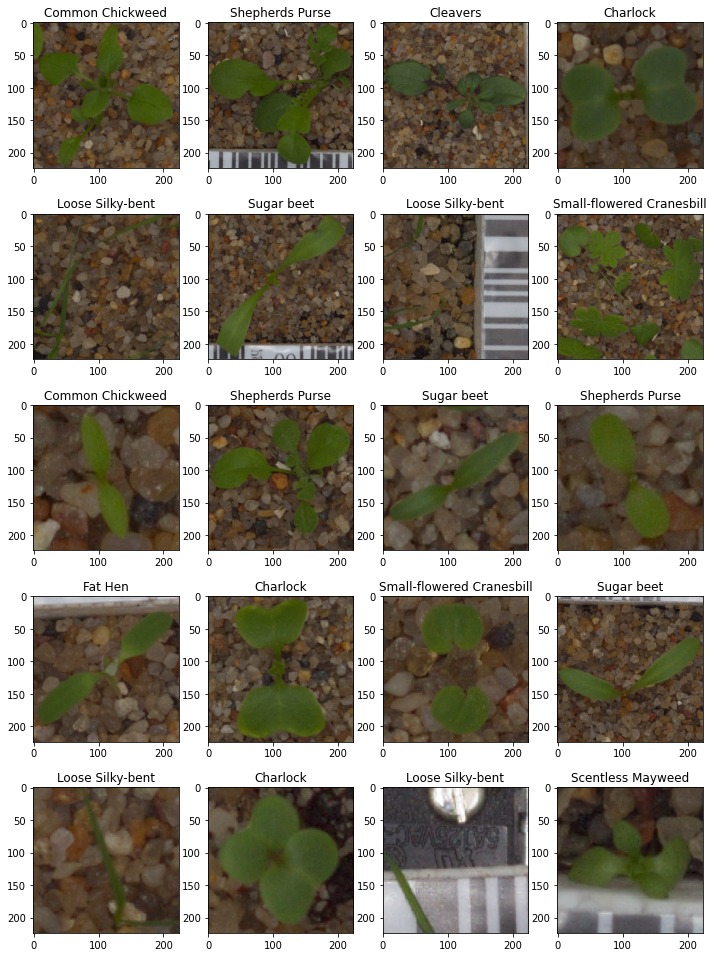

In [ ]:
show_top_images(image_training, label_training)

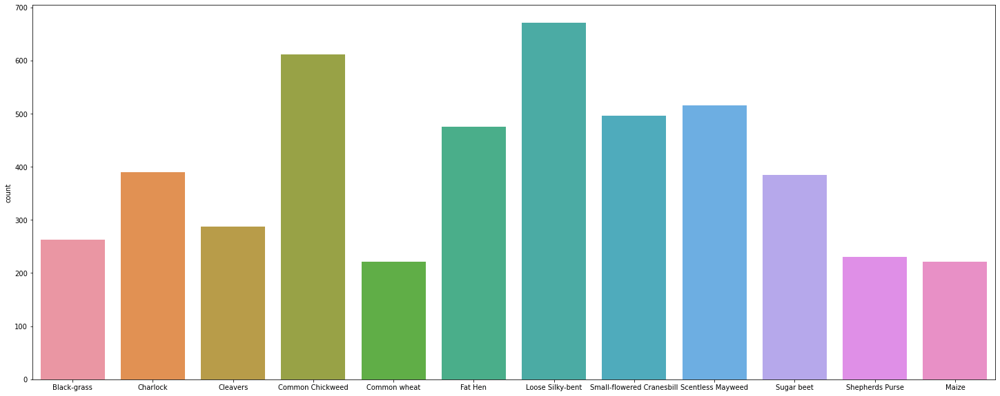

In [ ]:
plt.figure(figsize=(25, 10))
sns.countplot(label_training)

#### **Visualizing Image From Predict Set**

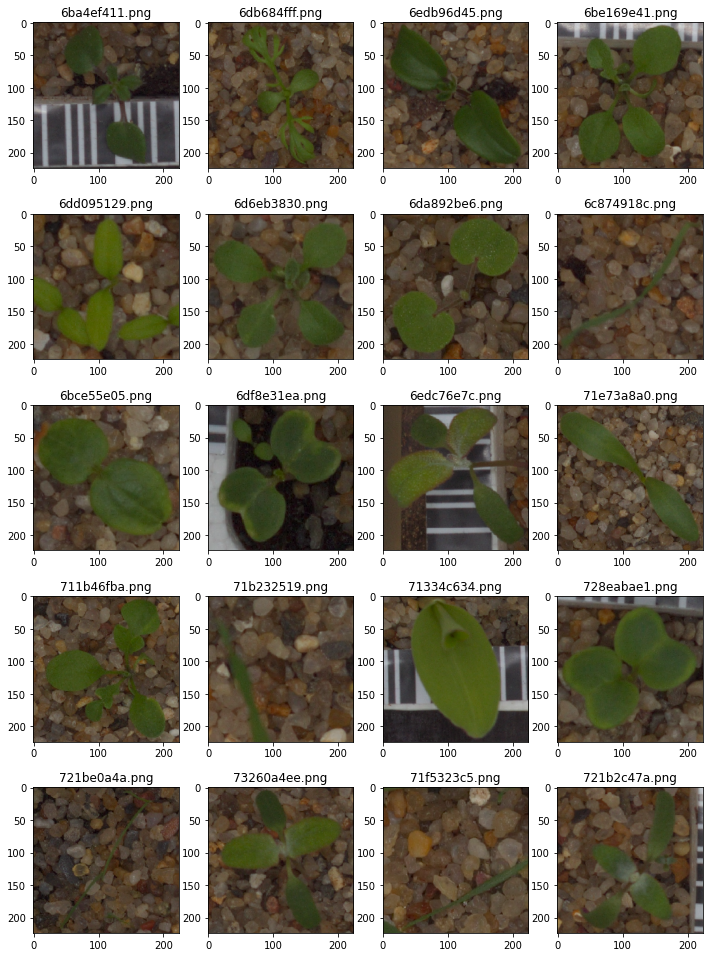

In [ ]:
show_top_images(image_predicting, label_predicting, plot_random=False)

In [ ]:
label_training_cat, lable_classes = to_categorical(label_training)

In [ ]:
lable_classes

['Black-grass',
 'Charlock',
 'Cleavers',
 'Common Chickweed',
 'Common wheat',
 'Fat Hen',
 'Loose Silky-bent',
 'Maize',
 'Scentless Mayweed',
 'Shepherds Purse',
 'Small-flowered Cranesbill',
 'Sugar beet']

In [ ]:
label_training_cat.shape

(4767, 12)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_training, label_training_cat, test_size=0.3, random_state=42)

In [ ]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3336, 224, 224, 3), (3336, 12), (1431, 224, 224, 3), (1431, 12))

<center><h4><b>Building And Training Model</b></h4></center>
<h4><b>1) Transfer Learning Method</b></h4>

In [ ]:
out_put_neurons = len(lable_classes)

In [ ]:
ptm_19 = PTM_19(weights='imagenet', 
            include_top=False, pooling='avg')
ptm_19.trainable = False

80142336/80134624 [==============================] - 0s 0us/step


In [ ]:
ptm_19.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [ ]:
training_features_19 = []
print("Extracting Training Features ...")
for train_image_19 in tqdm(X_train):
  with tf.device("/device:GPU:0"):
    img_19 = np.expand_dims(train_image_19, axis=0)
    training_feature_19 = ptm_19.predict(input19(img_19))[0]
    training_features_19.append(training_feature_19)
training_features_19 = np.array(training_features_19)
print("Done Extracting Training Features.")

Extracting Training Features ...



Done Extracting Training Features.


In [ ]:
training_features_19.shape

(3336, 512)

In [ ]:
testing_features_19 = []
print("Extracting Testing Features ...")
for test_image_19 in tqdm(X_test):
  with tf.device("/device:GPU:0"):
    tst_img_19 = np.expand_dims(test_image_19, axis=0)
    testing_feature_19 = ptm_19.predict(input19(tst_img_19))[0]
    testing_features_19.append(testing_feature_19)
testing_features_19 = np.array(testing_features_19)
print("Done Extracting Testing Features.")

Extracting Testing Features ...



Done Extracting Testing Features.


In [ ]:
testing_features_19.shape

(1431, 512)

In [ ]:
model_19 = Sequential([
    Dense(1024, input_shape=(512,)),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(512),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(out_put_neurons),
    Activation('softmax'),
])

model_19.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_19.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 1024)              525312    
_________________________________________________________________
activation_18 (Activation)   (None, 1024)              0         
_________________________________________________________________
batch_normalization_15 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_15 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_19 (Dense)             (None, 512)               524800    
_________________________________________________________________
activation_19 (Activation)   (None, 512)               0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 512)              

In [ ]:
mtf = tf.keras.callbacks
checkpoint_path = '/content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/ModelCheckPoint/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5'
model_checkpoint_callback = mtf.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [ ]:
with tf.device("/device:GPU:0"):
  model_19.fit(training_features_19, y_train, epochs=110, batch_size=8, 
               validation_data=(testing_features_19, y_test), verbose=1,
               shuffle=True, callbacks=[model_checkpoint_callback])

Epoch 1/110
417/417 [==============================] - 3s 5ms/step - loss: 2.9441 - accuracy: 0.1812 - val_loss: 1.5613 - val_accuracy: 0.4640
Epoch 2/110
417/417 [==============================] - 2s 4ms/step - loss: 2.1230 - accuracy: 0.3054 - val_loss: 1.3133 - val_accuracy: 0.5248
Epoch 3/110
417/417 [==============================] - 2s 4ms/step - loss: 1.8952 - accuracy: 0.3486 - val_loss: 1.1955 - val_accuracy: 0.5521
Epoch 4/110
417/417 [==============================] - 2s 4ms/step - loss: 1.6876 - accuracy: 0.4093 - val_loss: 1.0860 - val_accuracy: 0.5870
Epoch 5/110
417/417 [==============================] - 2s 4ms/step - loss: 1.5597 - accuracy: 0.4569 - val_loss: 0.9782 - val_accuracy: 0.6436
Epoch 6/110
417/417 [==============================] - 2s 4ms/step - loss: 1.4847 - accuracy: 0.4757 - val_loss: 0.8539 - val_accuracy: 0.6841
Epoch 7/110
417/417 [==============================] - 2s 4ms/step - loss: 1.3969 - accuracy: 0.5062 - val_loss: 0.7758 - val_accuracy: 0.7449

In [ ]:
history_19 = model_19.history.history

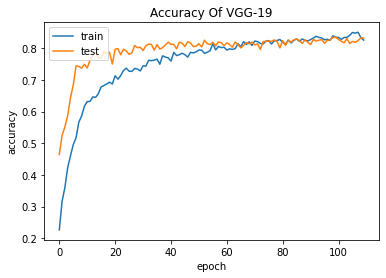

In [ ]:
# summarize history for accuracy
plt.plot(history_19['accuracy'])
plt.plot(history_19['val_accuracy'])
plt.title('Accuracy Of VGG-19')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

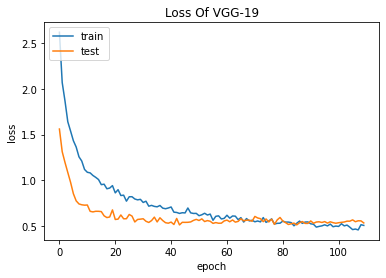

In [ ]:
# summarize history for loss
plt.plot(history_19['loss'])
plt.plot(history_19['val_loss'])
plt.title('Loss Of VGG-19')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
best_weights_path= '/content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/ModelCheckPoint/weights-improvement-99-0.84.hdf5'
model_19.load_weights(best_weights_path) 

In [ ]:
with tf.device("/device:GPU:0"):
  best_pred_19 = model_19.predict(testing_features_19)

In [ ]:
pred_19_val = pd.DataFrame(categorical_to_actual(best_pred_19, lable_classes), columns=['y_n', 'y'])['y'].values
y_test_val = pd.DataFrame(categorical_to_actual(y_test, lable_classes), columns=['y_n', 'y'])['y'].values

In [ ]:
print("Classification For VGG-19 Transfer Learning")
print("")
print(classification_report(y_test_val, pred_19_val))

Classification For VGG-19 Transfer Learning

              precision    recall  f1-score   support

           0       0.65      0.52      0.58        89
           1       0.95      0.88      0.91       120
           2       0.82      0.94      0.88        86
           3       0.87      0.88      0.87       190
           4       0.76      0.75      0.75        59
           5       0.87      0.82      0.84       137
           6       0.78      0.86      0.82       196
           7       0.87      0.89      0.88        66
           8       0.83      0.85      0.84       140
           9       0.70      0.67      0.68        82
          10       0.94      0.91      0.93       149
          11       0.86      0.87      0.87       117

    accuracy                           0.84      1431
   macro avg       0.82      0.82      0.82      1431
weighted avg       0.83      0.84      0.83      1431



Confusion Metrics For VGG-19 Transfer Learning



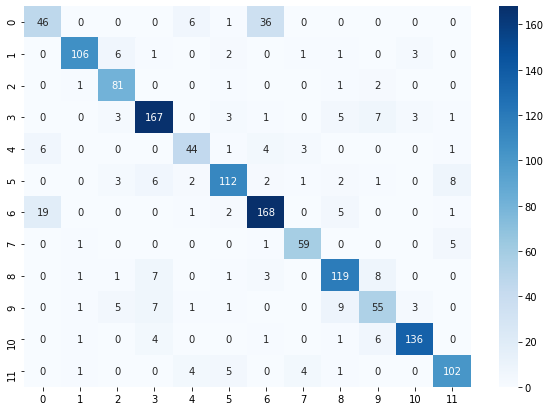

In [ ]:
print("Confusion Metrics For VGG-19 Transfer Learning")
print("")
create_confusion_matrics(y_test_val, pred_19_val)

In [ ]:
model_19.save("Model_19.hdf5")
model_19.save("Model_Weights_19.hdf5")

In [ ]:
!mkdir /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/SavedModel
!mv Model_19.hdf5 /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/SavedModel
!mv Model_Weights_19.hdf5 /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/SavedModel

<h4><b>2) Building Neural Network Model Method</b></h4>

In [ ]:
X_sup_train = X_train.reshape((X_train.shape[0], -1))
X_sup_test = X_test.reshape((X_test.shape[0], -1))
X_sup_test.shape

(1431, 150528)

In [ ]:
scratch_model = Sequential()
scratch_model.add(Dense(1024, input_shape = (150528, )))
scratch_model.add(Activation('relu'))
scratch_model.add(BatchNormalization())
scratch_model.add(Dropout(0.5))
scratch_model.add(Dense(1024))
scratch_model.add(Activation('relu'))    
scratch_model.add(BatchNormalization())
scratch_model.add(Dropout(0.5))
scratch_model.add(Dense(512))
scratch_model.add(Activation('relu'))
scratch_model.add(BatchNormalization())
scratch_model.add(Dropout(0.5))
scratch_model.add(Dense(128))
scratch_model.add(Activation('relu'))
scratch_model.add(BatchNormalization())
scratch_model.add(Dense(64))
scratch_model.add(Activation('relu'))
scratch_model.add(BatchNormalization())
scratch_model.add(Dropout(0.5))
scratch_model.add(Dense(32))
scratch_model.add(Activation('relu'))
scratch_model.add(Dense(out_put_neurons))
scratch_model.add(Activation('softmax'))
adam_w_bn_dl = adm(lr = 0.001)
scratch_model.compile(optimizer = adam_w_bn_dl, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
scratch_model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 1024)              154141696 
_________________________________________________________________
activation_13 (Activation)   (None, 1024)              0         
_________________________________________________________________
batch_normalization_13 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_14 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_22 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
activation_14 (Activation)   (None, 1024)              0         
_________________________________________________________________
batch_normalization_14 (Batc (None, 1024)             

In [ ]:
with tf.device("/device:GPU:0"):
  scratch_model.fit(X_sup_train, y_train, epochs=50, verbose = 1, validation_data=(X_sup_test, y_test), batch_size=10)

Epoch 1/50
334/334 [==============================] - 9s 24ms/step - loss: 2.8769 - accuracy: 0.1043 - val_loss: 2.4933 - val_accuracy: 0.1537
Epoch 2/50
334/334 [==============================] - 8s 23ms/step - loss: 2.5075 - accuracy: 0.1273 - val_loss: 2.2702 - val_accuracy: 0.2285
Epoch 3/50
334/334 [==============================] - 8s 23ms/step - loss: 2.3372 - accuracy: 0.1628 - val_loss: 2.1363 - val_accuracy: 0.2593
Epoch 4/50
334/334 [==============================] - 8s 23ms/step - loss: 2.2125 - accuracy: 0.2103 - val_loss: 2.0997 - val_accuracy: 0.2935
Epoch 5/50
334/334 [==============================] - 8s 23ms/step - loss: 2.0978 - accuracy: 0.2462 - val_loss: 2.2936 - val_accuracy: 0.2949
Epoch 6/50
334/334 [==============================] - 8s 23ms/step - loss: 2.0166 - accuracy: 0.2770 - val_loss: 2.7102 - val_accuracy: 0.3382
Epoch 7/50
334/334 [==============================] - 8s 23ms/step - loss: 1.9698 - accuracy: 0.2841 - val_loss: 3.2090 - val_accuracy: 0.2194

In [ ]:
scratch_model_pred = scratch_model.predict(X_sup_test)

In [ ]:
scratch_model_pred_sm = pd.DataFrame(categorical_to_actual(y_test, lable_classes), columns=['y_n', 'y'])['y'].values
y_test_sm = pd.DataFrame(categorical_to_actual(scratch_model_pred, lable_classes), columns=['y_n', 'y'])['y'].values

In [ ]:
print(classification_report(y_test_sm, scratch_model_pred_sm))

              precision    recall  f1-score   support

           0       0.06      0.31      0.10        16
           1       0.25      0.60      0.35        50
           2       0.13      0.41      0.19        27
           3       0.59      0.40      0.48       280
           4       0.00      0.00      0.00         4
           5       0.46      0.24      0.31       264
           6       0.39      0.48      0.43       161
           7       0.08      0.25      0.12        20
           8       0.49      0.28      0.36       243
           9       0.00      0.00      0.00         3
          10       0.83      0.39      0.53       317
          11       0.15      0.37      0.21        46

    accuracy                           0.36      1431
   macro avg       0.29      0.31      0.26      1431
weighted avg       0.53      0.36      0.40      1431



<h4><b>3)Traditional Machine Learning Model Method With SVM</b></h4>

In [ ]:
from sklearn.svm import SVC

In [ ]:
y_train_scv = pd.DataFrame(categorical_to_actual(y_train, lable_classes), columns=['y_n', 'y'])['y'].values
y_test_scv = pd.DataFrame(categorical_to_actual(y_test, lable_classes), columns=['y_n', 'y'])['y'].values

In [ ]:
with tf.device("/device:GPU:0"):
  svm = SVC(kernel='rbf', verbose=True, random_state=42)
  svm.fit(X_sup_train, y_train_scv)
  print(svm)

[LibSVM]SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=42, shrinking=True, tol=0.001,
    verbose=True)


In [ ]:
svc_pred = svm.predict(X_sup_test)

In [ ]:
print("Classification Report For SVM\n")
print(classification_report(y_test_scv, svc_pred))

Classification Report For SVM

              precision    recall  f1-score   support

           0       0.71      0.06      0.10        89
           1       0.59      0.61      0.60       120
           2       0.59      0.52      0.56        86
           3       0.53      0.63      0.57       190
           4       0.67      0.03      0.06        59
           5       0.46      0.34      0.39       137
           6       0.39      0.91      0.54       196
           7       1.00      0.12      0.22        66
           8       0.46      0.56      0.51       140
           9       1.00      0.01      0.02        82
          10       0.62      0.74      0.67       149
          11       0.51      0.34      0.41       117

    accuracy                           0.49      1431
   macro avg       0.63      0.41      0.39      1431
weighted avg       0.58      0.49      0.45      1431



Confusion Matircs For SVM



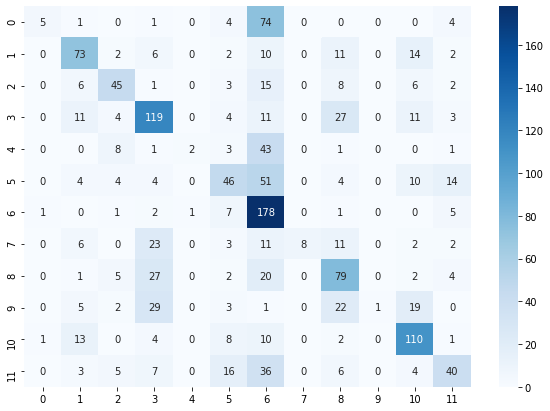

In [ ]:
print("Confusion Matircs For SVM\n")
create_confusion_matrics(y_test_scv, svc_pred)

<u>**Conclusion:**</u>
<table>
<p>
 By considering the all of the models accuracy, precision, recall, f1-score the best model turn out to be the one with cnn and transfer learning. 
</p>

**Predicting the class of the images from test folder**

In [ ]:
ptm_19 = PTM_19(weights='imagenet', 
            include_top=False, pooling='avg')
ptm_19.trainable = False

80142336/80134624 [==============================] - 1s 0us/step


In [ ]:
!cp /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/SavedModel/Model_19.hdf5 /content/Model_19.hdf5
!cp /content/drive/MyDrive/GreatLearning/PlantSeedlingClassificationData/SavedModel/Model_Weights_19.hdf5 /content/Model_Weights_19.hdf5

In [ ]:
print("Loading Model..")
my_model_19 = tf.keras.models.load_model('/content/Model_19.hdf5')
print("...............")
my_model_19.load_weights('/content/Model_Weights_19.hdf5')
print("Model Loaded.")

Loading Model..
...............
Model Loaded.


In [ ]:
file_names = []
pred_class = []
for predict_image, predict_filename in tqdm(zip(image_predicting, label_predicting)):
  file_names.append(predict_filename)
  with tf.device("/device:GPU:0"):
    img_pred_i = img_to_array(predict_image)
    img_pred_i = np.expand_dims(img_pred_i, axis=0)
    img_pred_i = ptm_19.predict(input19(img_pred_i))[0]
    img_pred_i = np.expand_dims(img_pred_i, axis=0)
    pred_class_probs = my_model_19.predict(img_pred_i)
    pred_class.append(lable_classes[np.argmax(pred_class_probs)])
file_names = np.array(file_names)
pred_class = np.array(pred_class)

In [ ]:
finalPredDataFrame = pd.DataFrame()
finalPredDataFrame['file'] = file_names
finalPredDataFrame['species'] = pred_class
finalPredDataFrame.head(5)

,file,species
0,67e185673.png,Small-flowered Cranesbill
1,6ba4ef411.png,Cleavers
2,6db684fff.png,Scentless Mayweed
3,6edb96d45.png,Cleavers
4,6be169e41.png,Shepherds Purse


In [ ]:
pred_images_titles = []
for file_name, pred_cls in zip(file_names, pred_class):
  pred_images_title = '{} {}'.format(file_name.replace('.png',''), pred_cls)
  pred_images_titles.append(pred_images_title)

In [ ]:
pred_images_titles[2]

'6db684fff Scentless Mayweed'

In [ ]:
finalPredDataFrameNew = finalPredDataFrame[['file', 'species']]

In [ ]:
finalPredDataFrameNew.to_csv('Plant_seeding_submission.csv', index=False)

In [ ]:
img_base_path = '/content/drive/MyDrive/GreatLearning/Plant_Seedling_Classification_Data/'
pred_img_dis = []
dispImgtargetSize = (224,224)
sub_set = finalPredDataFrameNew.iloc[:20, :]
for f_p in tqdm(sub_set['file']): 
  im_path = '{}/test/{}'.format(img_base_path, f_p)
  disp_img = load_img(im_path, color_mode='rgb', target_size= dispImgtargetSize)
  disp_img = np.array(disp_img)
  pred_img_dis.append(disp_img)

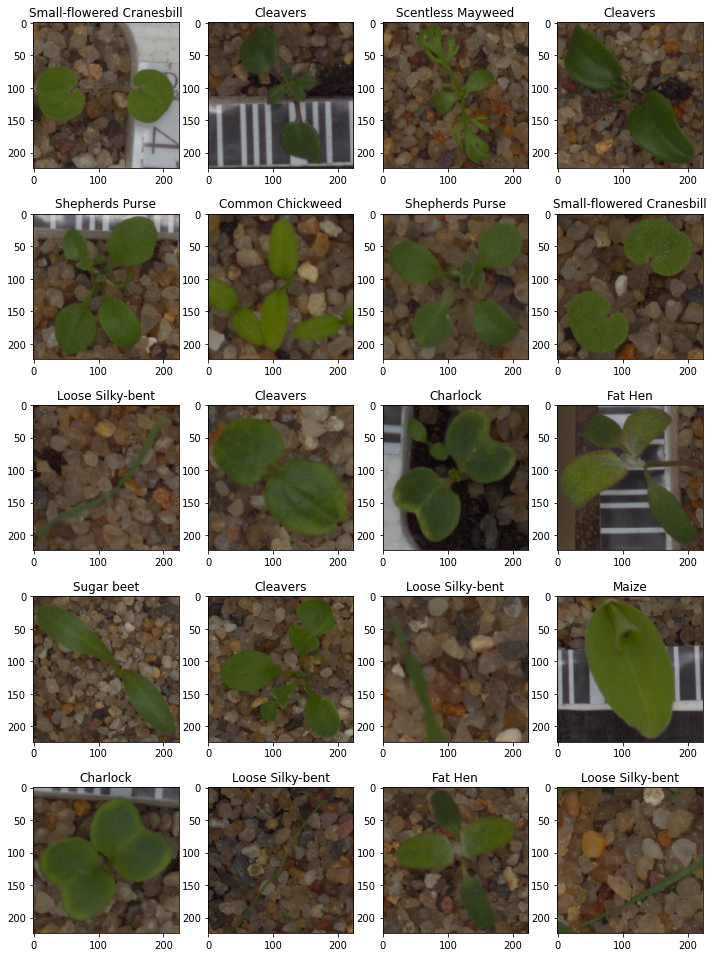

In [ ]:
show_top_images(pred_img_dis, list(sub_set['species']), plot_random=False)

<center><h1><b><u>PART-TWO</u></b></h1></center>
<p><b>Q.</b> Explain in depth why CNN out performs neural networks which in turn out perform supervised learning models when it comes to image classification</p>
<p><b>Ans.</b> From our example we can see that in <b>CNN</b> no of trainalble parameters are less compare to <b>Neural Networks</b>. On the other hand <b>Neural Networks</b> are not good at extracting features and hence they have very high number of weights to train and take very long time to be trained, where as <b>CNN</b> are trained to extract the features from the image and also have less weight to train which leads to consume lesser time in comparision with <b>Neural Networks</b>. Comparing <b>Neural Networks</b> and <b>CNN</b> to <b>Traditional Machine Learning Algorithms</b> these are actualy built for handling structured data and not for unstructured data like <b>Neural Networks</b> and <b>CNN's</b> are. And hence they will have very lesser perform in comparision with <b>Neural Networks</b> and <b>CNN's</b></p>


<center><h1><b><u>PART-THREE</u></b></h1></center>
<p><b><u>DOMAIN:</u></b> Automobile</p>
<p><b><u>CONTEXT:</u></b> A brand research company wants to understand which cars or car manufacturers are popular in a
certain area of the city or locality. Company has a team which takes pictures of the cars randomly through the
day. Using this the company wants to set up an automation which can classify the make of the car once the
picture has been given as an input.</p>

In [ ]:
car_dat_set_csv_path = '/content/drive/MyDrive/GreatLearning/Cars Images/Part3 -Cars_Annotations.xlsx'
cars_image_path = '/content/drive/MyDrive/GreatLearning/Cars Images'
car_image_generator_path = '/content/drive/MyDrive/GreatLearning/CarsImages'

In [ ]:
!mkdir /content/drive/MyDrive/GreatLearning/CarsImages

In [ ]:
cars_data_df = pd.read_excel(car_dat_set_csv_path)
cars_data_df

,No.,Image,Color,Make
0,1,00001.jpg,White,Audi
1,2,00002.jpg,Black.,Acura
2,3,00003.jpg,Red,Dodge
3,4,00004.jpg,Red,Hyundai
4,5,00005.jpg,White,Ford
5,6,00006.jpg,Red,Unknown
6,7,00007.jpg,Blue,Dodge
7,8,00008.jpg,Red,Dodge
8,9,00009.jpg,Gray,Mitsubishi
9,10,00010.jpg,Silver,Chevrolet


In [ ]:
cars_data_df.columns

Index(['No.', 'Image ', 'Color', 'Make'], dtype='object')

In [ ]:
dirs = list(cars_data_df['Make'].unique())

In [ ]:
dirs

['Audi',
 'Acura',
 'Dodge',
 'Hyundai',
 'Ford',
 'Unknown',
 'Mitsubishi',
 'Chevrolet',
 'Toyota',
 'Volvo']

In [ ]:
augment_paths = []
for dir in dirs:
  path = '{}/{}'.format(car_image_generator_path, dir)
  os.mkdir(path)
  augment_paths.append(path)
  print("{} Created.".format(path))

/content/drive/MyDrive/GreatLearning/CarsImages/Audi Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Acura Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Dodge Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Hyundai Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Ford Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Unknown Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Mitsubishi Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Chevrolet Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Toyota Created.
/content/drive/MyDrive/GreatLearning/CarsImages/Volvo Created.


In [ ]:
car_image_size = (200, 200)
cars_images = []
cars_lables = []
for image_name, car_make in zip(cars_data_df['Image '].values, cars_data_df['Make'].values):
  car_image_path = '{}/{}'.format(cars_image_path, image_name)
  car_img = load_img(car_image_path, color_mode='rgb', target_size= car_image_size)
  car_img = np.array(car_img)
  cars_images.append(car_img)
  cars_lables.append(car_make)

Text(0.5, 1.0, 'Audi')

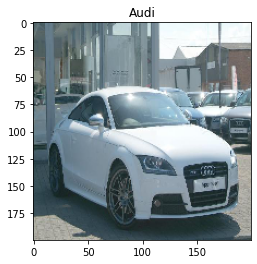

In [ ]:
plt.imshow(cars_images[0])
plt.title(cars_lables[0])

In [ ]:
augmented = []
aug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True, 
  vertical_flip=True,
	fill_mode="nearest")

In [ ]:
print("Image Data Augmenting....")
for training_car_image in tqdm(cars_images):
  car_img_expand = np.expand_dims(training_car_image, axis=0)
  aug_data = aug.flow(car_img_expand, batch_size=1)
  augmented.append(aug_data)
print("Done Image Data Augmenting.")


Image Data Augmenting....



Done Image Data Augmenting.


In [ ]:
len(augmented), len(cars_lables)

(15, 15)

In [ ]:
#@title Image Generator { run: "auto", form-width: "400px" }
enter_no_images_to_generate = 30 #@param {type:"integer"} 

#this will create that
#many no of image of each classe


In [ ]:
car_training_data_augmented = []
car_training_data_lable = []
print("Generaring Data...")
for i in tqdm(range(len(augmented))):
  label = cars_lables[i]
  img_aug_data = augmented[i]
  for i in range(enter_no_images_to_generate):
    batch = img_aug_data.next()
    image = batch[0].astype('uint8')
    image = np.array(image)
    car_training_data_augmented.append(image)
    car_training_data_lable.append(label)
print("Generaring Data Done.")

Generaring Data...



Generaring Data Done.


In [ ]:
len(car_training_data_augmented), len(car_training_data_lable)

(450, 450)

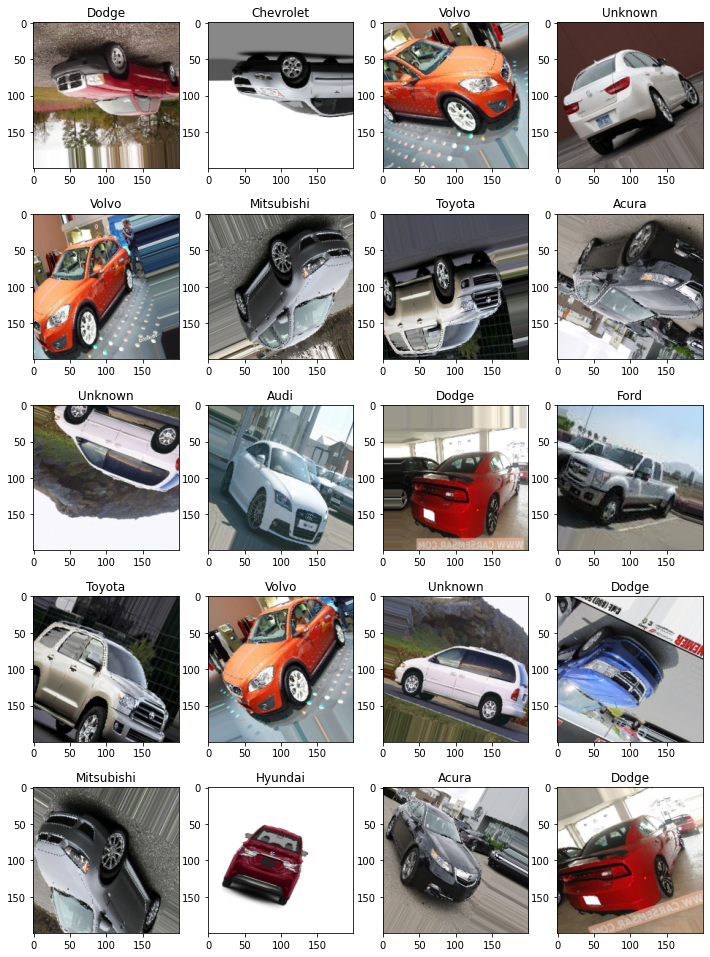

In [ ]:
show_top_images(car_training_data_augmented, car_training_data_lable, plot_random=True)

In [ ]:
from PIL import Image

In [ ]:
def colorChanger(image):
    image = np.array(image)
    hsv_image = cv2.cvtColor(image,cv2.COLOR_RGB2HSV)
    return Image.fromarray(hsv_image)

In [ ]:
augmented_cc = []
aug_cc = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True, 
  vertical_flip=True,
	fill_mode="nearest",
  preprocessing_function=colorChanger)

In [ ]:

print("Image Data Augmenting....")
for index in tqdm(range(len(car_training_data_augmented))):
  aug_car_image = car_training_data_augmented[index]
  aug_car_lable = car_training_data_lable[index]
  save_path = '{}/{}'.format(car_image_generator_path, aug_car_lable)
  car_img_expand = np.expand_dims(aug_car_image, axis=0)
  aug_data = aug.flow(car_img_expand, batch_size=1, save_to_dir=save_path, save_prefix=aug_car_lable)
  augmented_cc.append(aug_data)
print("Done Image Data Augmenting.")

Image Data Augmenting....



Done Image Data Augmenting.


In [ ]:
car_training_data_augmented_cc = []
car_training_data_lable_cc = []
print("Generaring Data...")
for i in tqdm(range(len(augmented_cc))):
  label_aug_cc = car_training_data_lable[i]
  img_aug_data_cc = augmented_cc[i]
  for i in range(enter_no_images_to_generate):
    batch = img_aug_data_cc.next()
    image = batch[0].astype('uint8')
    image = np.array(image)
    car_training_data_augmented_cc.append(image)
    car_training_data_lable_cc.append(label_aug_cc)
print("Generaring Data Done.")

Generaring Data...



Generaring Data Done.


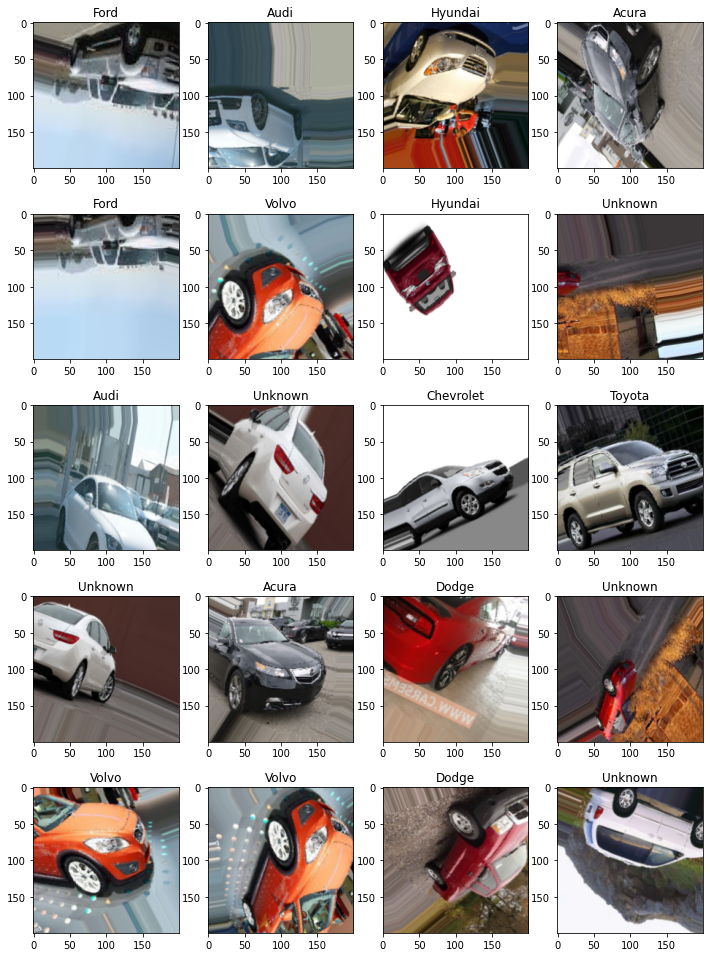

In [ ]:
show_top_images(car_training_data_augmented_cc, car_training_data_lable_cc, plot_random=True)

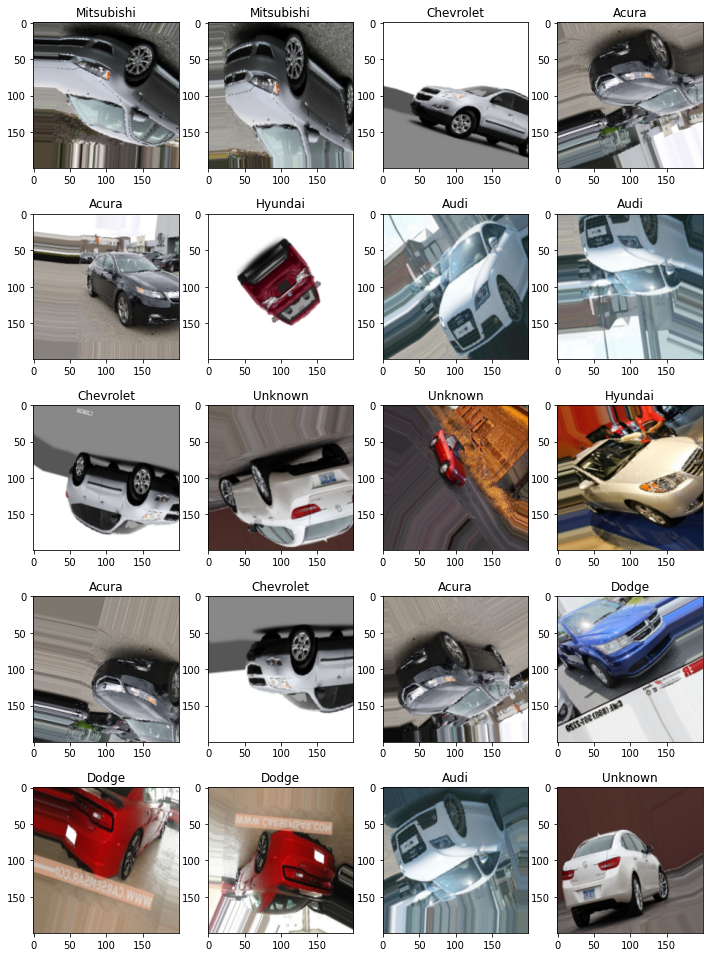

In [ ]:
show_top_images(car_training_data_augmented_cc, car_training_data_lable_cc, plot_random=True)

In [ ]:
print("Creating Dataset......")
car_aug_cc_img_ds = np.array(car_training_data_augmented_cc)
print(".")
car_aug_cc_lbl_ds = np.array(car_training_data_lable_cc)
print(".")
car_data_dict = dict()
print(".")
car_data_dict["Images"] = car_aug_cc_img_ds
print(".")
car_data_dict["Labels"] = car_aug_cc_lbl_ds
print(".")
car_dataset_file = open('CarDataset.plk', 'ab')
print(".")
pickle.dump(car_data_dict, car_dataset_file)
print(".")
car_dataset_file.close()
print(".")
print("Dataset Created.")

Creating Dataset......
.
.
.
.
.
.
.
.
Dataset Created.


In [ ]:
!cp /content/CarDataset.plk /content/drive/MyDrive/GreatLearning/CarsImages/CarDataset.plk

**Comment:** Challengs faced during createing the dataset
<ul>
  <li>In most of the case there was only one image for each class</li>
  <li>There was no sufficient images to build a dataset</li>
</ul>

<center><h1><b><u>PART-FOUR</u></b></h1></center>

<p><b><u>DOMAIN:</u></b> Botanical research</p>

<p><b><u>CONTEXT:</u></b> : University X is currently undergoing some research involving understanding the characteristics of
flowers. They already have have invested on curating sample images. They require an automation which can
create a classifier capable of determining a flower’s species from a photo</p>

<p><b><u>PROJECT OBJECTIVE:</u></b> :  Company’s management requires an automation which can create a classifier capable of
determining a flower’s species from a photo</p>

**Import Dataset**

In [ ]:
!pip install tflearn

     |████████████████████████████████| 112kB 5.5MB/s 
  Created wheel for tflearn: filename=tflearn-0.5.0-cp36-none-any.whl size=127301 sha256=76d830c80df73452b0784f7bc4c9e18509d31e6e4456510ca6ffe1c47cef0499
  Stored in directory: /root/.cache/pip/wheels/31/d2/ed/fb9a0d301dd9586c11e9547120278e624227f22fd5f4baf744
Successfully built tflearn


In [ ]:
 import tflearn.datasets.oxflower17 as flower_dataset 

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
X ,y = flower_dataset.load_data()

100.0% 60276736 / 60270631


Succesfully downloaded 17flowers.tgz 60270631 bytes.
File Extracted
Starting to parse images...
Parsing Done!


In [ ]:
X.shape, y.shape

((1360, 224, 224, 3), (1360,))

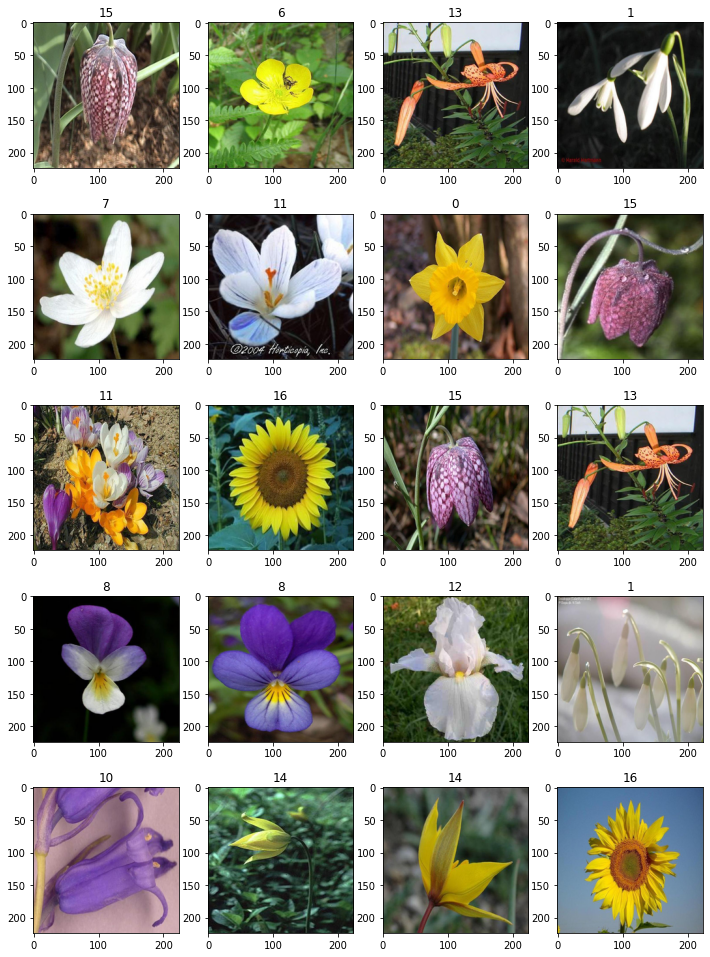

In [ ]:
show_top_images(X, y, plot_random=True)

In [ ]:
pd.DataFrame(y, columns=['y'])['y'].unique()

array([ 7, 16, 14,  0,  8, 12,  4,  3,  5,  2,  9, 13, 15,  6,  1, 11, 10])

In [ ]:
len(pd.DataFrame(y, columns=['y'])['y'].unique())

17

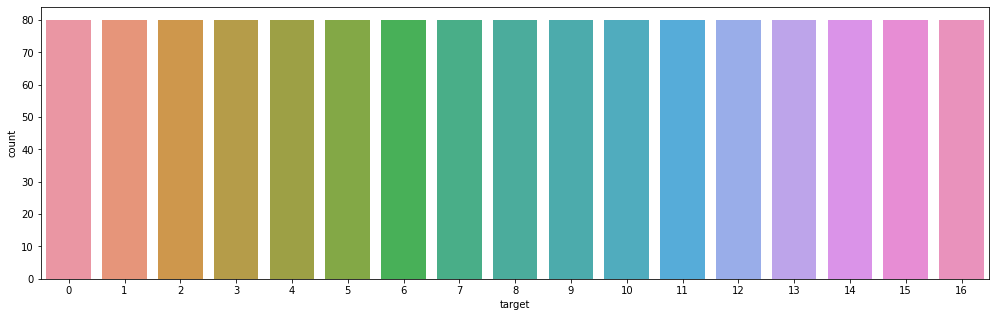

In [ ]:
plt.figure(figsize=(17, 5))
sns.countplot(pd.DataFrame(y, columns=['target'])['target'])

**Applying filters**

In [ ]:
from skimage.feature import canny

In [ ]:
filter_X = X[:20, :]
filter_y = y[:20]

In [ ]:
filter_X.shape, filter_y.shape

((20, 224, 224, 3), (20,))

**Apply Gray filter**

In [ ]:
gray_images = []
for f_img in filter_X:
  img_gray = cv.cvtColor(f_img,  cv2.COLOR_RGB2GRAY)
  gray_images.append(img_gray)

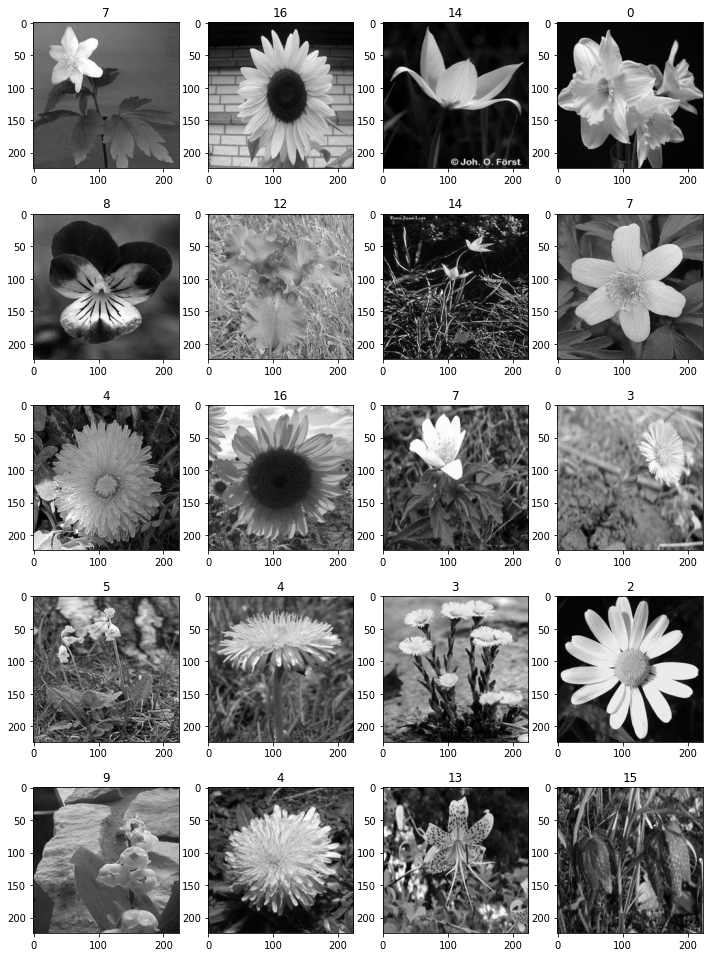

In [ ]:
show_top_images(gray_images, filter_y, plot_random=False)

**Appling Blur Filter**

In [ ]:
blur_imgs = []
for bimg in filter_X:
  blur_imgs.append(cv2.GaussianBlur(bimg, (15,15),0))

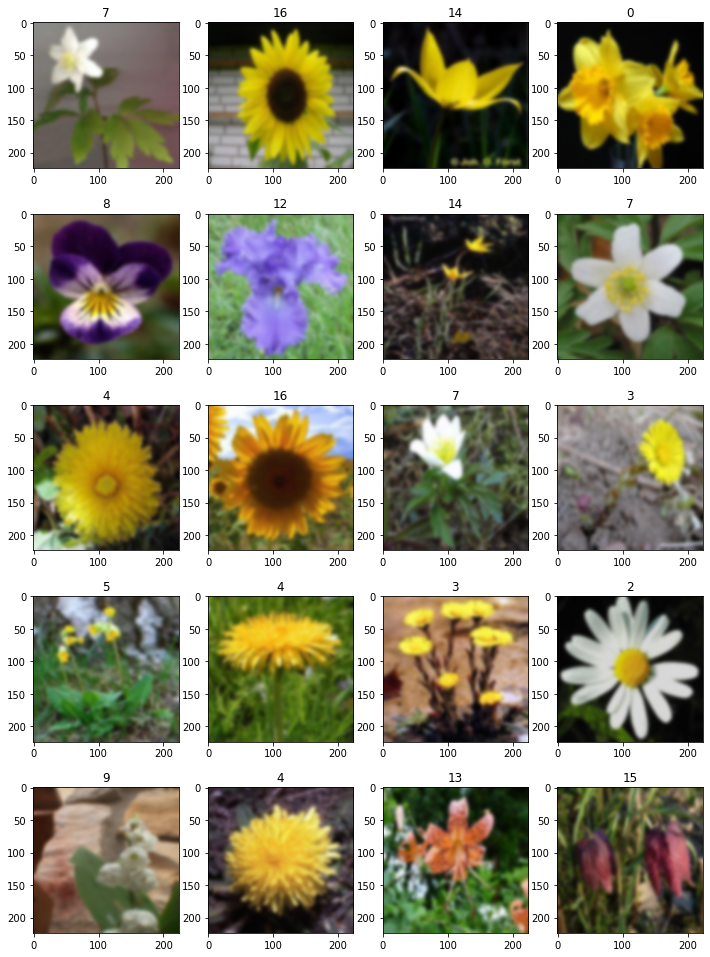

In [ ]:
show_top_images(blur_imgs, filter_y, plot_random=False)

**Appling Edge Detection Filter**

In [ ]:
edges_detected = []
for gimg in gray_images:
  gimg = cv2.GaussianBlur(gimg, (9,9),0)
  edges = canny(gimg)
  edges_detected.append(edges)

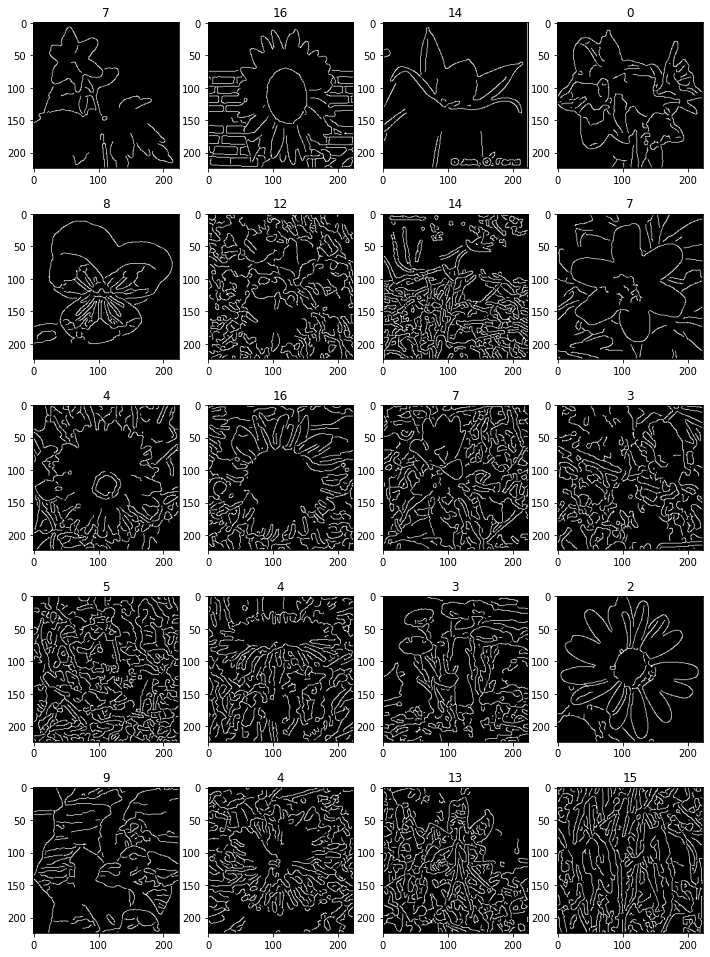

In [ ]:
show_top_images(edges_detected, filter_y, plot_random=False)

In [ ]:
X_train_f, X_test_f, y_train_f, y_test_f = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train_f.shape, X_test_f.shape, y_train_f.shape, y_test_f.shape

((952, 224, 224, 3), (408, 224, 224, 3), (952,), (408,))

In [ ]:
cat_train_y = tf.keras.utils.to_categorical(y_train_f)
cat_test_y = tf.keras.utils.to_categorical(y_test_f)

In [ ]:
base_model_16 = PTM_16(weights='imagenet')
for layer in base_model_16.layers:
 layer.trainable = False

553467904/553467096 [==============================] - 12s 0us/step


In [ ]:
model_16 = Model(inputs=base_model_16.input, outputs=base_model_16.get_layer('flatten').output)
model_16.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [ ]:
flower_clf_16 = Sequential()

In [ ]:
flower_clf_16.add(model_16)
flower_clf_16.add(Dense(1024, activation='relu'))
flower_clf_16.add(BatchNormalization())
flower_clf_16.add(Dropout(0.4))
flower_clf_16.add(Dense(512, activation='relu'))
flower_clf_16.add(BatchNormalization())
flower_clf_16.add(Dropout(0.4))
flower_clf_16.add(Dense(128, activation='relu'))
flower_clf_16.add(BatchNormalization())
flower_clf_16.add(Dropout(0.4))
flower_clf_16.add(Dense(64, activation='relu'))
flower_clf_16.add(BatchNormalization())
flower_clf_16.add(Dropout(0.4))
flower_clf_16.add(Dense(32, activation='relu'))
flower_clf_16.add(BatchNormalization())
flower_clf_16.add(Dropout(0.4))
flower_clf_16.add(Dense(17, activation='softmax'))

In [ ]:
flower_clf_16.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
flower_clf_16.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_1 (Functional)         (None, 25088)             14714688  
_________________________________________________________________
dense_51 (Dense)             (None, 1024)              25691136  
_________________________________________________________________
batch_normalization_42 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_40 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_52 (Dense)             (None, 512)               524800    
_________________________________________________________________
batch_normalization_43 (Batc (None, 512)               2048      
_________________________________________________________________
dropout_41 (Dropout)         (None, 512)              

In [ ]:
flower_mtf = tf.keras.callbacks
checkpoint_path_flr = '/content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/flr_weights_improvement_{epoch:02d}-{val_acc:.2f}.hdf5'
model_checkpoint_callback_flr_1 = flower_mtf.ModelCheckpoint(
    filepath=checkpoint_path_flr,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [ ]:
with tf.device('/device:GPU:0'):
  flower_clf_16.fit(X_train_f, cat_train_y, epochs=50, batch_size=10, 
               validation_data=(X_test_f, cat_test_y), verbose=1,
               shuffle=True, callbacks=[model_checkpoint_callback_flr_1])

Train on 952 samples, validate on 408 samples
Epoch 1/50
952/952 [==============================] - 5s 6ms/sample - loss: 3.2848 - acc: 0.1008 - val_loss: 3.9346 - val_acc: 0.1324
Epoch 2/50
952/952 [==============================] - 5s 5ms/sample - loss: 2.7764 - acc: 0.1523 - val_loss: 2.2202 - val_acc: 0.3015
Epoch 3/50
952/952 [==============================] - 5s 5ms/sample - loss: 2.6058 - acc: 0.1954 - val_loss: 1.8554 - val_acc: 0.3775
Epoch 4/50
952/952 [==============================] - 5s 5ms/sample - loss: 2.4156 - acc: 0.2195 - val_loss: 1.7285 - val_acc: 0.4706
Epoch 5/50
952/952 [==============================] - 5s 5ms/sample - loss: 2.2660 - acc: 0.2731 - val_loss: 1.6639 - val_acc: 0.5417
Epoch 6/50
952/952 [==============================] - 5s 5ms/sample - loss: 2.1701 - acc: 0.3057 - val_loss: 1.6143 - val_acc: 0.5539
Epoch 7/50
952/952 [==============================] - 5s 5ms/sample - loss: 1.9985 - acc: 0.3529 - val_loss: 1.5504 - val_acc: 0.5686
Epoch 8/50
952/9

In [ ]:
flower_clf_16.evaluate(X_test_f, cat_test_y)

[0.6793914121740005, 0.7916667]

In [ ]:
flr_clf_16_pred = flower_clf_16.predict(X_test_f)

In [ ]:
flr_clf_16_pred = np.array([np.argmax(p) for p in flr_clf_16_pred])

In [ ]:
print(classification_report(y_test_f, flr_clf_16_pred))

              precision    recall  f1-score   support

           0       0.67      0.67      0.67        21
           1       0.82      0.78      0.80        36
           2       1.00      0.96      0.98        23
           3       1.00      0.72      0.84        18
           4       0.77      0.95      0.85        21
           5       0.68      0.52      0.59        33
           6       0.72      0.88      0.79        33
           7       0.90      0.86      0.88        21
           8       0.94      0.73      0.82        22
           9       0.68      0.86      0.76        22
          10       0.94      0.70      0.80        23
          11       0.61      0.67      0.64        21
          12       0.95      0.91      0.93        23
          13       0.88      0.81      0.85        27
          14       0.41      0.72      0.52        18
          15       0.89      0.81      0.85        21
          16       1.00      0.96      0.98        25

    accuracy              

Confusion Metrics for VGG-16


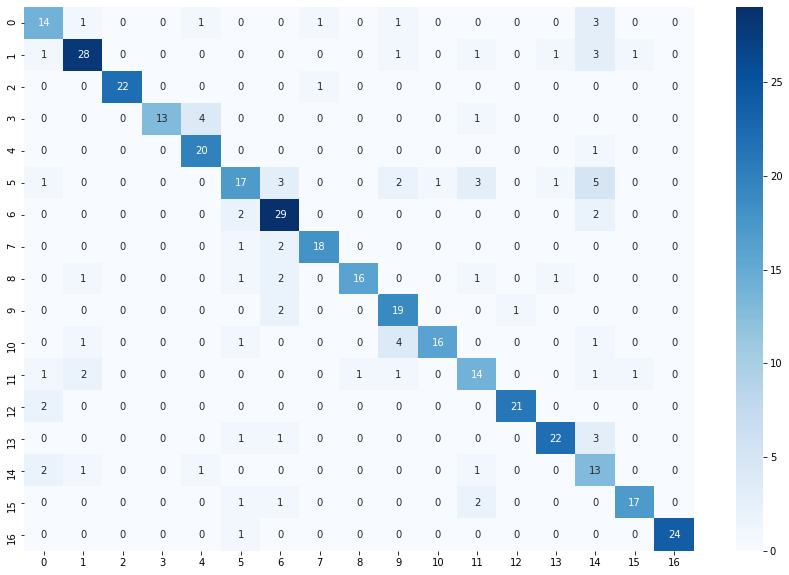

In [ ]:
print("Confusion Metrics for VGG-16")
create_confusion_matrics(y_test_f, flr_clf_16_pred, figsize=(15,10))

In [ ]:
flr_ptm = PTM_19(include_top=False, pooling='avg', weights='imagenet')

In [ ]:
flr_ptm.trainable = False

In [ ]:
flr_ptm.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [ ]:
flr_clf_model_19 = Sequential([
   flr_ptm,                         
    Dense(1024, input_shape=(512,)),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(512),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256),
    Activation('relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(17),
    Activation('softmax'),
])

flr_clf_model_19.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
flr_clf_model_19.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 512)               20024384  
_________________________________________________________________
dense_57 (Dense)             (None, 1024)              525312    
_________________________________________________________________
activation (Activation)      (None, 1024)              0         
_________________________________________________________________
batch_normalization_47 (Batc (None, 1024)              4096      
_________________________________________________________________
dropout_45 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_58 (Dense)             (None, 512)               524800    
_________________________________________________________________
activation_1 (Activation)    (None, 512)              

In [ ]:
mtf = tf.keras.callbacks
#/content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/flr_19_weights_improvement_{epoch:02d}-{val_accuracy:.2f}.hdf5
checkpoint_path_frl_19 = '/content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/flr_19_weights_improvement_{epoch:02d}-{val_acc:.2f}.hdf5'
model_checkpoint_callback_frl_19 = mtf.ModelCheckpoint(
    filepath=checkpoint_path_frl_19,
    save_weights_only=False,
    monitor='val_acc',
    mode='max',
    save_best_only=True)

In [ ]:
with tf.device('/device:GPU:0'):
  flr_clf_model_19.fit(X_train_f, cat_train_y, epochs=50, batch_size=10, 
               validation_data=(X_test_f, cat_test_y), verbose=1,
               shuffle=True, callbacks=[model_checkpoint_callback_frl_19])

Train on 952 samples, validate on 408 samples
Epoch 1/50
952/952 [==============================] - 8s 8ms/sample - loss: 3.4845 - acc: 0.1124 - val_loss: 2.6819 - val_acc: 0.1569
Epoch 2/50
952/952 [==============================] - 6s 6ms/sample - loss: 2.7210 - acc: 0.2227 - val_loss: 2.2725 - val_acc: 0.3505
Epoch 3/50
952/952 [==============================] - 6s 6ms/sample - loss: 2.4896 - acc: 0.2689 - val_loss: 1.8397 - val_acc: 0.4681
Epoch 4/50
952/952 [==============================] - 6s 6ms/sample - loss: 2.3296 - acc: 0.2889 - val_loss: 1.5065 - val_acc: 0.5515
Epoch 5/50
952/952 [==============================] - 5s 6ms/sample - loss: 2.2182 - acc: 0.3193 - val_loss: 1.4887 - val_acc: 0.5270
Epoch 6/50
952/952 [==============================] - 6s 6ms/sample - loss: 2.0938 - acc: 0.3550 - val_loss: 1.2759 - val_acc: 0.5907
Epoch 7/50
952/952 [==============================] - 6s 6ms/sample - loss: 1.9536 - acc: 0.3834 - val_loss: 1.2023 - val_acc: 0.5980
Epoch 8/50
952/9

In [204]:
best_model_19_path='/content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/flr_19_weights_improvement_49-0.82.hdf5'
flr_clf_model_19.load_weights(best_model_19_path)

In [ ]:
flr_clf_model_19_pred = flr_clf_model_19.predict(X_test_f)

In [ ]:
flr_clf_model_19_pred_a = np.array([np.argmax(px) for px in flr_clf_model_19_pred])

In [ ]:
flr_history_19 = flr_clf_model_19.history.history

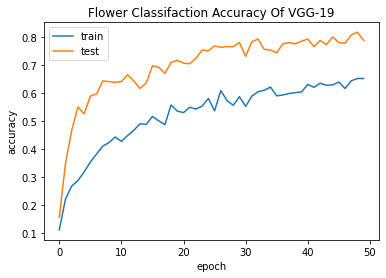

In [ ]:
# summarize history for accuracy
plt.plot(flr_history_19['acc'])
plt.plot(flr_history_19['val_acc'])
plt.title('Flower Classifaction Accuracy Of VGG-19')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

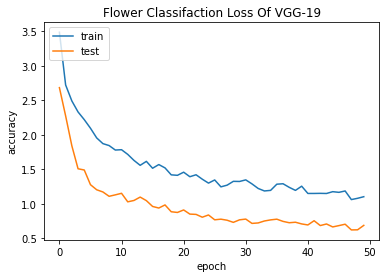

In [ ]:
# summarize history for accuracy
plt.plot(flr_history_19['loss'])
plt.plot(flr_history_19['val_loss'])
plt.title('Flower Classifaction Loss Of VGG-19')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
print("Classification Report For VGG-19")
print(classification_report(y_test_f, flr_clf_model_19_pred_a))

Classification Report For VGG-19
              precision    recall  f1-score   support

           0       0.76      0.90      0.83        21
           1       0.96      0.72      0.83        36
           2       1.00      0.96      0.98        23
           3       0.83      0.83      0.83        18
           4       0.90      0.86      0.88        21
           5       0.55      0.79      0.65        33
           6       0.93      0.82      0.87        33
           7       0.78      0.86      0.82        21
           8       0.86      0.82      0.84        22
           9       0.95      0.86      0.90        22
          10       0.68      0.91      0.78        23
          11       0.67      0.67      0.67        21
          12       0.88      0.96      0.92        23
          13       0.96      0.81      0.88        27
          14       0.42      0.28      0.33        18
          15       0.94      0.81      0.87        21
          16       0.96      1.00      0.98     

Confusion Matrics for VGG-19


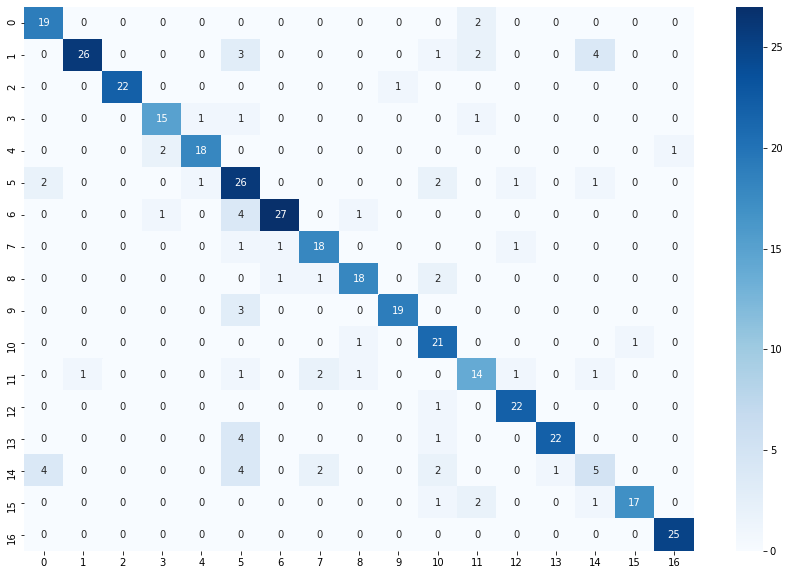

In [ ]:
print("Confusion Matrics for VGG-19")
create_confusion_matrics(y_test_f, flr_clf_model_19_pred_a, figsize=(15,10))

<p><b>Conclusion: </b>
  Considering The accuracy of the pretrained Model We conclude that using pretrained model VGG-16 is has better performance in terms of accuracy, presision, recall and f1-score. 
</p>

In [ ]:
flr_clf_model_19.save("Flower_classifier.hdf5")

In [151]:
!cp /content/Flower_classifier.hdf5 /content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/Flower_classifier.hdf5

In [152]:
!cp /content/drive/MyDrive/GreatLearning/FlowerModelCheckPoint/flr_19_weights_improvement_49-0.82.hdf5 /content/flr_19_weights_improvement_49-0.82.hdf5

**GUI Part**

In [153]:
def load_model():
  weights_path='/content/flr_19_weights_improvement_49-0.82.hdf5'
  flr_mdl = tf.keras.models.load_model('/content/Flower_classifier.hdf5')
  flr_mdl.load.load_weights(weights_path)
  return flr_mdl

In [ ]:
!pip install ipyfilechooser

In [155]:
import ipywidgets as widgets
from IPython.display import display
from ipyfilechooser import FileChooser
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt
output = widgets.Output()

In [163]:
#@title Target Size { form-width: "450px" }
target_w =  224 #@param {type:"integer"}
target_h =   224#@param {type:"integer"}

target_size= (target_w,target_h)

In [206]:
#@title Image Height { vertical-output: true, form-width: "450px" }
img_width = 224 #@param {type:"integer"} 
img_hight = 224 #@param {type:"integer"}

fc = FileChooser(change_desc="Select")
fc.title = '<b>Choose the File</b>'
fc.use_dir_icons = True

imgwgt = widgets.Image(width=img_width,height=img_hight)
text = widgets.Text(
    placeholder='Prediction.',
    disabled=True
)

In [210]:
def on_predict_click(buttonEvent):

  with output:
    file = open(fc.selected, "rb")
    image_file = file.read()
    imgwgt.value = image_file
    img = load_img(fc.selected, color_mode='rgb', target_size= target_size)
    img = np.array(img)
    img = np.expand_dims(img, axis=0)
    preds = flr_clf_model_19.predict(img)
    actual_val = np.argmax(preds)
  
    text_mess = 'Predicted Class: {}'.format(actual_val)
    text.value = text_mess

In [211]:
buttonPredict = widgets.Button(description="Predict")
buttonPredict.on_click(on_predict_click)
html = widgets.HTML(
    value="<center><h2 style='color: blue'><b>CLASSIFIER GUI - Great Learning</b></h2></center>",
)

In [212]:
display(html)
display(fc)
display(text)
display(imgwgt, output)
display(buttonPredict,output)

HTML(value="<center><h2 style='color: blue'><b>CLASSIFIER GUI - Great Learning</b></h2></center>")

FileChooser(path='/content', filename='', title='HTML(value='<b>Choose the File</b>')', show_hidden='False', u…

Text(value='Class: 16', disabled=True, placeholder='Prediction.')

Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x0…

Output()

Button(description='Predict', style=ButtonStyle())

Output()

<center><h1><b><u>PART-FIVE</u></b></h1></center>
<p><b>Q.</b>Explain in depth your strategy to maintain and support the AIML image classifier after it in production.</p>
<p>
  Observe the model in production for it performance if it perform better on unseen data set in production then train it on new accuired dataset for the week and then redeploy to production if it is not perform better in production we remove from the production retrain it by tuning hyperparameters and check the performance then deploy the model to production.
</p>